# Student Stress Factors
---

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2023

## 1. About the project
---

**Project Overview:**
This project aims to enhance my skills in analyzing and presenting data using Jupyter Notebook.

**Dataset Description:**
The dataset comprises approximately 20 features that significantly contribute to assessing the stress levels of students. These features are selected based on five major factors: Psychological, Physiological, Social, Environmental, and Academic. The chosen features include:

- **Psychological Factors:**
  - 'anxiety_level'
  - 'self_esteem'
  - 'mental_health_history'
  - 'depression'

- **Physiological Factors:**
  - 'headache'
  - 'blood_pressure'
  - 'sleep_quality'
  - 'breathing_problem'

- **Environmental Factors:**
  - 'noise_level'
  - 'living_conditions'
  - 'safety'
  - 'basic_needs'

- **Academic Factors:**
  - 'academic_performance'
  - 'study_load'
  - 'teacher_student_relationship'
  - 'future_career_concerns'

- **Social Factor:**
  - 'social_support'
  - 'peer_pressure'
  - 'extracurricular_activities'
  - 'bullying'


This diverse set of features allows for a comprehensive analysis of student stress, covering aspects ranging from psychological well-being to academic and social factors. The goal is to gain valuable insights into the various dimensions that contribute to student stress levels.

* You can found the dataset in this [link](https://www.kaggle.com/datasets/rxnach/student-stress-factors-a-comprehensive-analysis)

## 2. Libraries
---

In [1]:
# Data Manipulation
import pandas as pd
import numpy as np

# Visualization
from matplotlib import pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.tree import plot_tree
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank
from optuna.visualization import plot_timeline

# Data Normalization and Spliting
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split

# Hyperparameter tuning
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import optuna

# Machine learning models
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier 
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Metrics
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score

# Deep Learning
import tensorflow as tf

sns.set_style('darkgrid')
pd.set_option('display.max_columns', None)

/home/konstantinosmpouros/.local/lib/python3.10/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
2024-10-10 17:10:15.534728: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-10 17:10:15.554673: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-10 17:10:15.554683: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factor

In [2]:
import warnings
warnings.filterwarnings("ignore")

## 3. Data loading

In [3]:
student_stress = pd.read_csv('Datasets/StressLevelDataset.csv')
student_stress.head()

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,safety,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
0,14,20,0,11,2,1,2,4,2,3,3,2,3,2,3,3,2,3,3,2,1
1,15,8,1,15,5,3,1,4,3,1,2,2,1,4,1,5,1,4,5,5,2
2,12,18,1,14,2,1,2,2,2,2,3,2,2,3,3,2,2,3,2,2,1
3,16,12,1,15,4,3,1,3,4,2,2,2,2,4,1,4,1,4,4,5,2
4,16,28,0,7,2,3,5,1,3,2,4,3,4,3,1,2,1,5,0,5,1


In [4]:
student_stress.shape

(1100, 21)

## 4. EDA and Data Understanding
---

In [5]:
student_stress.describe()

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,safety,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
count,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000,1100.000000
mean,11.063636,17.777273,0.492727,12.555455,2.508182,2.181818,2.660000,2.753636,2.649091,2.518182,2.737273,2.772727,2.772727,2.621818,2.648182,2.649091,1.881818,2.734545,2.767273,2.617273,0.996364
std,6.117558,8.944599,0.500175,7.727008,1.409356,0.833575,1.548383,1.400713,1.328127,1.119208,1.406171,1.433761,1.414594,1.315781,1.384579,1.529375,1.047826,1.425265,1.417562,1.530958,0.821673
min,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.000000,11.000000,0.000000,6.000000,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,1.000000,0.000000
50%,11.000000,19.000000,0.000000,12.000000,3.000000,2.000000,2.500000,3.000000,3.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.500000,3.000000,1.000000
75%,16.000000,26.000000,1.000000,19.000000,3.000000,3.000000,4.000000,4.000000,3.000000,3.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,4.000000,4.000000,2.000000
max,21.000000,30.000000,1.000000,27.000000,5.000000,3.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,5.000000,5.000000,5.000000,2.000000


In [6]:
student_stress.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1100 entries, 0 to 1099
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype
---  ------                        --------------  -----
 0   anxiety_level                 1100 non-null   int64
 1   self_esteem                   1100 non-null   int64
 2   mental_health_history         1100 non-null   int64
 3   depression                    1100 non-null   int64
 4   headache                      1100 non-null   int64
 5   blood_pressure                1100 non-null   int64
 6   sleep_quality                 1100 non-null   int64
 7   breathing_problem             1100 non-null   int64
 8   noise_level                   1100 non-null   int64
 9   living_conditions             1100 non-null   int64
 10  safety                        1100 non-null   int64
 11  basic_needs                   1100 non-null   int64
 12  academic_performance          1100 non-null   int64
 13  study_load                    110

In [7]:
student_stress.isna().sum()

anxiety_level                   0
self_esteem                     0
mental_health_history           0
depression                      0
headache                        0
blood_pressure                  0
sleep_quality                   0
breathing_problem               0
noise_level                     0
living_conditions               0
safety                          0
basic_needs                     0
academic_performance            0
study_load                      0
teacher_student_relationship    0
future_career_concerns          0
social_support                  0
peer_pressure                   0
extracurricular_activities      0
bullying                        0
stress_level                    0
dtype: int64

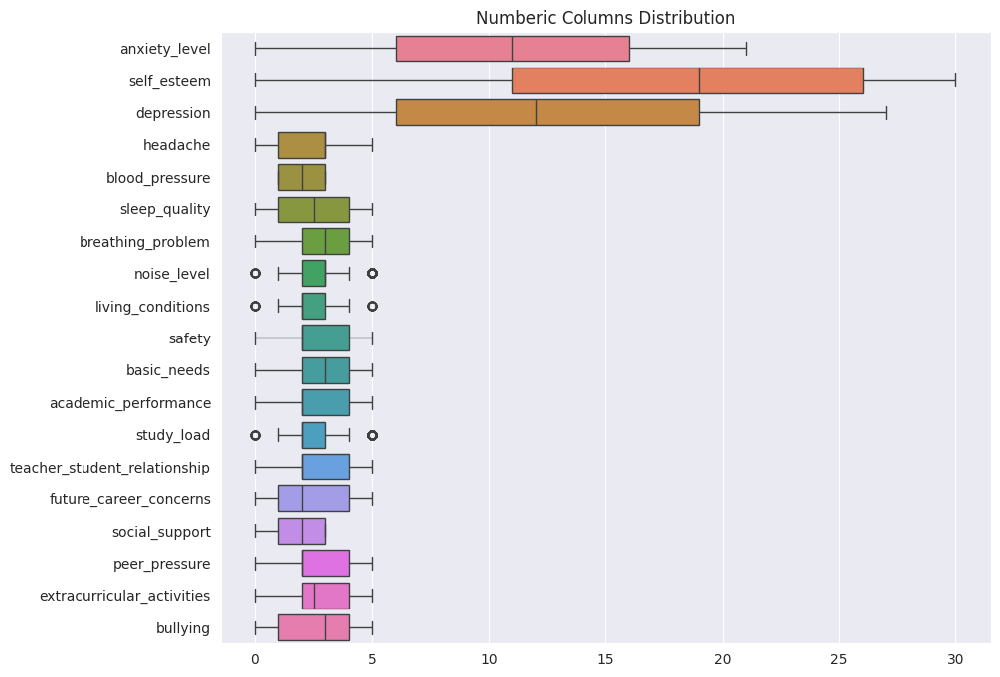

In [8]:
plt.figure(figsize=(10,8))
sns.boxplot(student_stress.drop(['mental_health_history', 'stress_level'], axis=1), orient='h')
plt.title('Numberic Columns Distribution')
plt.savefig('Graphs/EDA/numeric_col_distribution.png')
plt.show()

<Figure size 1200x700 with 0 Axes>

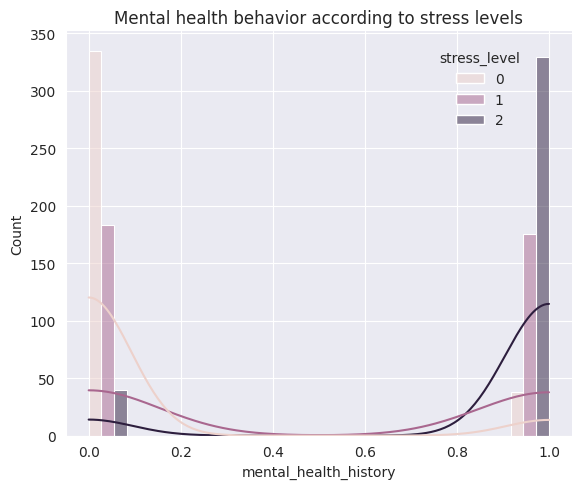

In [9]:
plt.figure(figsize=(12,7))

g = sns.displot(student_stress, x='mental_health_history', hue='stress_level', multiple='dodge', legend=True, kde=True)

plt.title('Mental health behavior according to stress levels')
plt.tight_layout()

g._legend.set_bbox_to_anchor((.9, .8)) 

plt.savefig('Graphs/EDA/mental_health_behavior.png')
plt.show()

In [10]:
stress_level_counts = student_stress[['mental_health_history', 'stress_level']] \
                                                                .value_counts() \
                                                                .sort_index() \
                                                                .unstack(0)
stress_level_counts

mental_health_history,0,1
stress_level,,
0,335,38
1,183,175
2,40,329


<Figure size 1300x700 with 0 Axes>

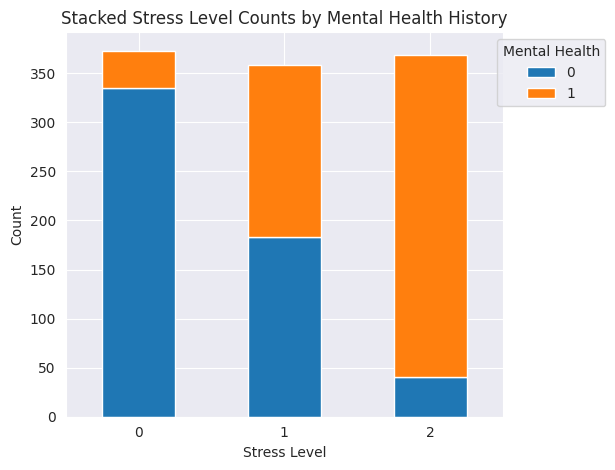

In [11]:
plt.figure(figsize=(13,7))

stress_level_counts.plot(kind='bar', stacked=True)

plt.xlabel('Stress Level')
plt.ylabel('Count')
plt.title('Stacked Stress Level Counts by Mental Health History')
plt.xticks(rotation=0)
plt.legend(title='Mental Health', loc='upper right', bbox_to_anchor=(1.25, 1))

plt.tight_layout()
plt.savefig('Graphs/EDA/Stress_level_by_mental_health.png')
plt.show()

In [12]:
scaler = MinMaxScaler(feature_range=(0, 5))
student_stress_scaled = pd.DataFrame(scaler.fit_transform(student_stress.values))
stress_categ = student_stress_scaled.groupby(20).agg('mean')
stress_categ

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
20,,,,,,,,,,,,,,,,,,,,
0.0,1.293247,4.208668,0.509383,1.113593,1.313673,2.989276,4.126005,1.697051,1.648794,3.313673,4.099196,4.144772,4.142091,1.654155,3.927614,1.335121,4.235925,1.675603,1.715818,1.254692
2.5,2.721468,3.210428,2.444134,2.198945,2.460894,0.810056,2.530726,2.927374,2.511173,2.502793,2.416201,2.477654,2.491620,2.533520,2.357542,2.522346,3.631285,2.458101,2.480447,2.555866
5.0,3.905020,1.463415,4.457995,3.672087,3.761518,5.000000,1.303523,3.653117,3.794038,1.728997,1.672087,1.672087,1.661247,3.685637,1.636856,4.100271,1.544715,4.073171,4.108401,4.054201


In [13]:
fig, axs = plt.subplots(1, 3, figsize=(27, 10), subplot_kw=dict(polar=True))

count = 0
for i in stress_categ.index.values:
    data = stress_categ.loc[i]
    
    values = data.values.copy().tolist()
    categories = student_stress.columns[:-1].copy()
    
    # Number of categories
    num_categories = len(categories)
    
    # Calculate angle for each category
    angles = np.linspace(0, 2 * np.pi, num_categories, endpoint=False).tolist()

    # Close the plot
    values += values[:1]
    angles += angles[:1]

    # Plot
    axs[count].plot(angles, values, marker='o', linestyle='solid', linewidth=2)

    # Fill the area under the plot
    axs[count].fill(angles, values, alpha=0.4)

    # Adding labels to each axis
    axs[count].set_thetagrids(np.degrees(angles[:-1]), labels=categories)

    # Enter the title according to the category
    if count == 0:
        axs[count].set_title('Stress level 1', fontsize=17)
    elif count == 1:
        axs[count].set_title('Stress level 2', fontsize=17)
    else:
        axs[count].set_title('Stress level 3', fontsize=17)
    count += 1
    
# Store the plot
plot = plt.gcf()
plot.savefig('Graphs/EDA/stress_level_characteristics.png')
plt.close()

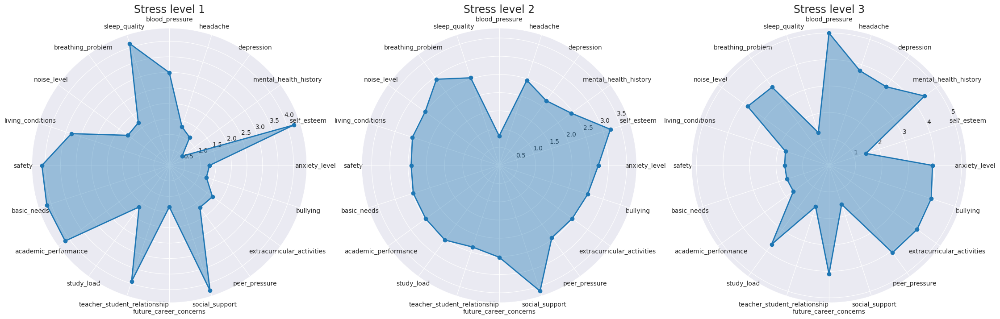

In [14]:
plot

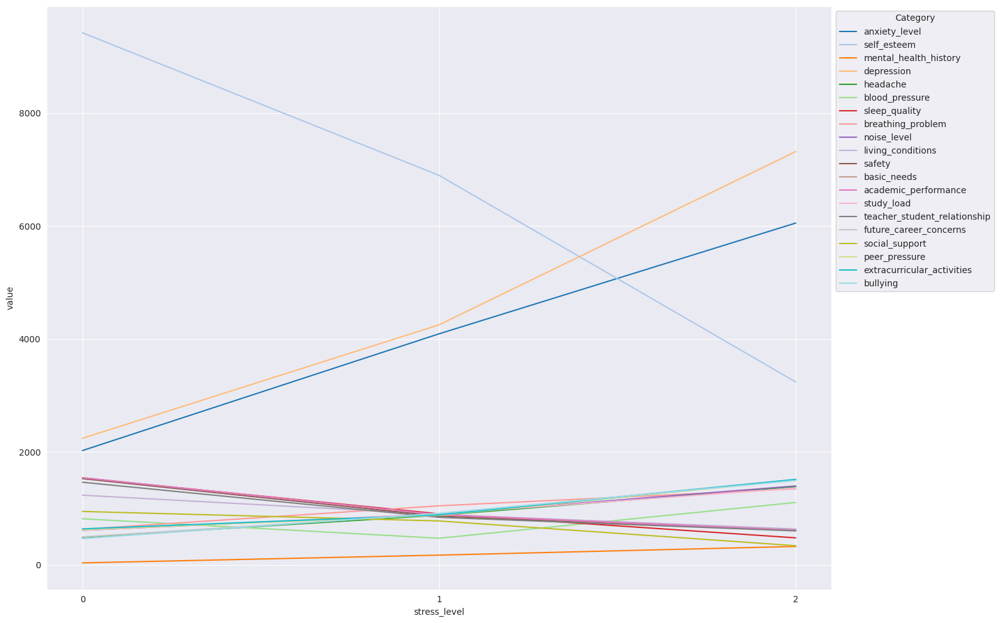

In [15]:
# Group and sum the data once
grouped_data = student_stress.groupby('stress_level').sum()

# Reshape the data to long format
long_format_data = grouped_data.reset_index().melt(id_vars='stress_level')

# Get the colormap
cmap = plt.get_cmap('tab20')

# Create the figure
plt.figure(figsize=(16, 10))

# Plot each category (replace 'variable' with your actual category column name if different)
for i, col in enumerate(grouped_data.columns):
    sns.lineplot(data=long_format_data[long_format_data['variable'] == col],
                 x='stress_level',
                 y='value',
                 label=col,
                 color=cmap(i % 20))  # Using modulo 20 to cycle through colors

# Customize the plot
plt.xticks([0, 1, 2])
plt.legend(title='Category', loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()

# Show the plot
plt.savefig('Graphs/EDA/Var_behave_by_stress_lvl.png')
plt.show()

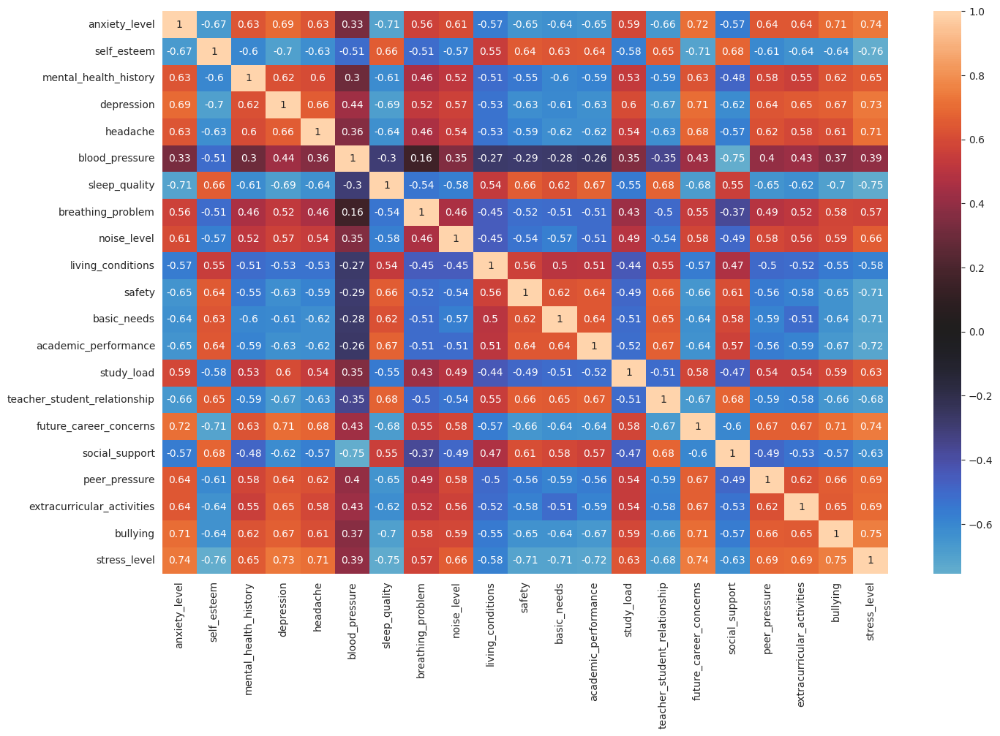

In [16]:
plt.figure(figsize=(16, 10))
sns.heatmap(student_stress.corr(), annot=True, center=0)
plt.savefig('Graphs/EDA/correlations.png')
plt.show()

## 5. Machine learning modeling
---

In [17]:
student_stress.head()

,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,safety,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
0,14,20,0,11,2,1,2,4,2,3,3,2,3,2,3,3,2,3,3,2,1
1,15,8,1,15,5,3,1,4,3,1,2,2,1,4,1,5,1,4,5,5,2
2,12,18,1,14,2,1,2,2,2,2,3,2,2,3,3,2,2,3,2,2,1
3,16,12,1,15,4,3,1,3,4,2,2,2,2,4,1,4,1,4,4,5,2
4,16,28,0,7,2,3,5,1,3,2,4,3,4,3,1,2,1,5,0,5,1


In [18]:
X = student_stress.iloc[:, :-1]
y = student_stress['stress_level']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=33, shuffle=True)

In [19]:
def plot_confusion_matrix(y_test, y_pred, save_name):
    plt.figure(figsize=(10, 8))

    cm = np.round(confusion_matrix(y_test, y_pred), 0)
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
        
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    
    plt.savefig(f'Graphs/Modeling/{save_name}.png')    
    plt.show()

### Linear Regression

### Stochastic gradient descent

In [20]:
sgd = SGDClassifier(random_state=33)
sgd.fit(X_train, y_train)

SGDClassifier(random_state=33)

In [21]:
sgd.score(X_test, y_test)

0.9136363636363637

In [22]:
y_pred = sgd.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.93      0.91        82
           1       0.92      0.88      0.90        68
           2       0.93      0.93      0.93        70

    accuracy                           0.91       220
   macro avg       0.92      0.91      0.91       220
weighted avg       0.91      0.91      0.91       220



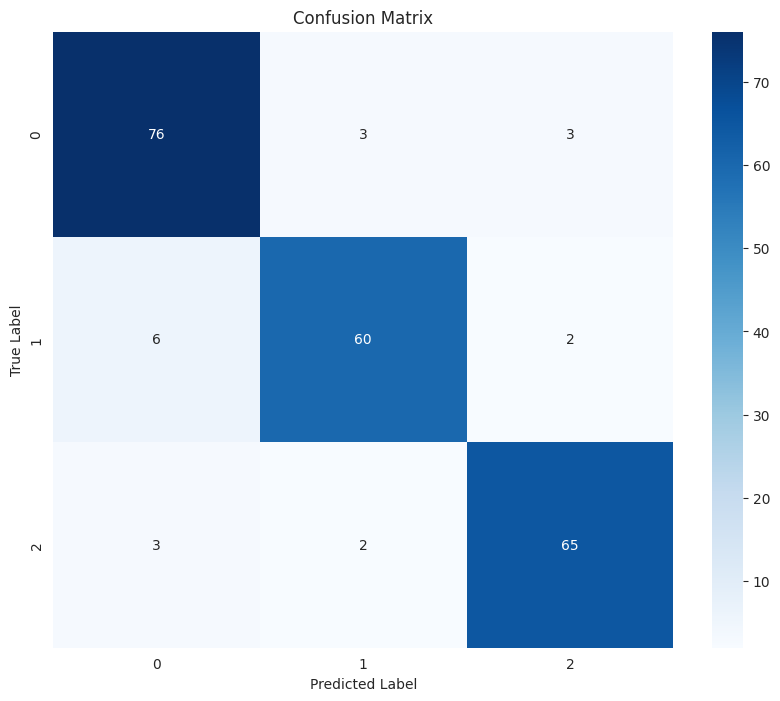

In [23]:
plot_confusion_matrix(y_test, y_pred, 'sgd_cm')

In [24]:
params = {
    'alpha': [.1, .3, .5, .75, 1, 2, 5, 10],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'l1_ratio': np.linspace(.0001,0.99, 10),
    'epsilon': np.linspace(0, 10, 20),
    'tol': [.001, .01, .1],
    'max_iter': [1000],
    'warm_start': [True, False]
}

In [25]:
sgd_grid_search = GridSearchCV(SGDClassifier(random_state=33), params, cv=5, n_jobs=-1)
sgd_pipeline = make_pipeline(StandardScaler(), sgd_grid_search)
sgd_pipeline.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('gridsearchcv',
                 GridSearchCV(cv=5, estimator=SGDClassifier(random_state=33),
                              n_jobs=-1,
                              param_grid={'alpha': [0.1, 0.3, 0.5, 0.75, 1, 2,
                                                    5, 10],
                                          'epsilon': array([ 0.        ,  0.52631579,  1.05263158,  1.57894737,  2.10526316,
        2.63157895,  3.15789474,  3.68421053,  4.21052632,  4.73684211,
        5.26315789,  5.78947368,  6.31578947,  6.84210526,  7.36842105,
        7.89473684,  8.42105263,  8.94736842,  9.47368421, 10.        ]),
                                          'l1_ratio': array([1.00000000e-04, 1.10088889e-01, 2.20077778e-01, 3.30066667e-01,
       4.40055556e-01, 5.50044444e-01, 6.60033333e-01, 7.70022222e-01,
       8.80011111e-01, 9.90000000e-01]),
                                          'max_iter': [1000],
                                          'penalty': ['l1', 'l2', 'elasticnet'],
                                          'tol': [0.001, 0.01, 0.1],
                                          'warm_start': [True, False]}))])

In [26]:
sgd_grid_search.best_params_

{'alpha': 0.1,
 'epsilon': 0.0,
 'l1_ratio': 0.44005555555555553,
 'max_iter': 1000,
 'penalty': 'elasticnet',
 'tol': 0.1,
 'warm_start': True}

In [27]:
sgd_grid_search.best_estimator_, sgd_grid_search.best_score_

(SGDClassifier(alpha=0.1, epsilon=0.0, l1_ratio=0.44005555555555553,
               penalty='elasticnet', random_state=33, tol=0.1, warm_start=True),
 0.8795454545454545)

In [28]:
y_pred = sgd_pipeline.predict(X_test)

In [29]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.89      0.91        82
           1       1.00      0.85      0.92        68
           2       0.82      0.99      0.90        70

    accuracy                           0.91       220
   macro avg       0.92      0.91      0.91       220
weighted avg       0.92      0.91      0.91       220



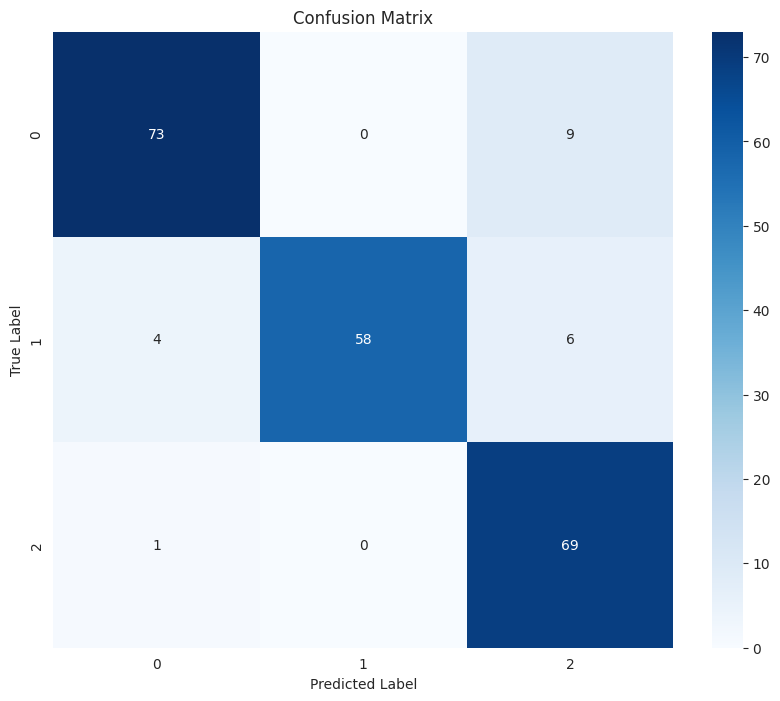

In [30]:
plot_confusion_matrix(y_test, y_pred, 'sgd_grid_cm')

In [31]:
def objective_sgd(trial):

    scaler = trial.suggest_categorical('scaler', ['StandardScaler', 'MinMaxScaler', None])
    if scaler == 'StandardScaler':
        scaler = StandardScaler()
    elif scaler == 'MinMaxScaler':
        scaler = MinMaxScaler()
    
    alpha = trial.suggest_float('alpha', 0.01, 1)
    epsilon = trial.suggest_float('epsilon', 0.01, 1)
    l1_ratio = trial.suggest_float('l1_ratio', 0.01, 1)
    penalty = trial.suggest_categorical('penalty', [None, 'elasticnet', 'l1', 'l2'])
    warm_start = trial.suggest_categorical('warm_start', [True, False])
    
    sgd = SGDClassifier(alpha=alpha,
                         epsilon=epsilon,
                         l1_ratio=l1_ratio,
                         penalty=penalty,
                         warm_start=warm_start,
                         max_iter=1000,
                         random_state=33
                         )

    pipeline = make_pipeline(scaler, sgd)

    score = cross_val_score(pipeline, X_train, y_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [32]:
study_sgd = optuna.create_study(direction="maximize")
study_sgd.optimize(objective_sgd, n_trials=200, n_jobs=-1)

[I 2024-10-10 17:11:00,258] A new study created in memory with name: no-name-b319982b-bda0-43b0-b137-9c7b1c087c44
[I 2024-10-10 17:11:00,342] Trial 0 finished with value: 0.875 and parameters: {'scaler': 'StandardScaler', 'alpha': 0.25631813970434264, 'epsilon': 0.2315638478492754, 'l1_ratio': 0.21189988775346433, 'penalty': 'elasticnet', 'warm_start': False}. Best is trial 0 with value: 0.875.
[I 2024-10-10 17:11:00,371] Trial 2 finished with value: 0.3306818181818182 and parameters: {'scaler': 'StandardScaler', 'alpha': 0.5918626086545666, 'epsilon': 0.5744402314635089, 'l1_ratio': 0.1302387864701467, 'penalty': 'l1', 'warm_start': True}. Best is trial 0 with value: 0.875.
[I 2024-10-10 17:11:00,414] Trial 1 finished with value: 0.8647727272727271 and parameters: {'scaler': None, 'alpha': 0.5785877983743317, 'epsilon': 0.24701073596714693, 'l1_ratio': 0.9590599725955353, 'penalty': None, 'warm_start': True}. Best is trial 0 with value: 0.875.
[I 2024-10-10 17:11:00,420] Trial 3 finis

In [33]:
print('Number of finished trials: ', len(study_sgd.trials))
print('Best trial:')
trial = study_sgd.best_trial

print('Value: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'    {key}: {value}')

Number of finished trials:  200
Best trial:
Value:  0.8909090909090909
Params: 
    scaler: None
    alpha: 0.28300297592601464
    epsilon: 0.12395185726780861
    l1_ratio: 0.8454353766889715
    penalty: elasticnet
    warm_start: True


In [34]:
trials_df = study_sgd.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_epsilon,params_l1_ratio,params_penalty,params_scaler,params_warm_start,state
197,197,0.890909,2024-10-10 17:11:05.482775,2024-10-10 17:11:05.853377,0 days 00:00:00.370602,0.283003,0.123952,0.845435,elasticnet,None,True,COMPLETE
170,170,0.889773,2024-10-10 17:11:04.796012,2024-10-10 17:11:05.281332,0 days 00:00:00.485320,0.243233,0.061551,0.871162,elasticnet,None,True,COMPLETE
195,195,0.889773,2024-10-10 17:11:05.454054,2024-10-10 17:11:05.851122,0 days 00:00:00.397068,0.277193,0.113552,0.849295,elasticnet,None,True,COMPLETE
190,190,0.889773,2024-10-10 17:11:05.366327,2024-10-10 17:11:05.813416,0 days 00:00:00.447089,0.245248,0.129305,0.872342,elasticnet,None,True,COMPLETE
71,71,0.889773,2024-10-10 17:11:01.587215,2024-10-10 17:11:02.153781,0 days 00:00:00.566566,0.264119,0.839498,0.830799,elasticnet,None,True,COMPLETE


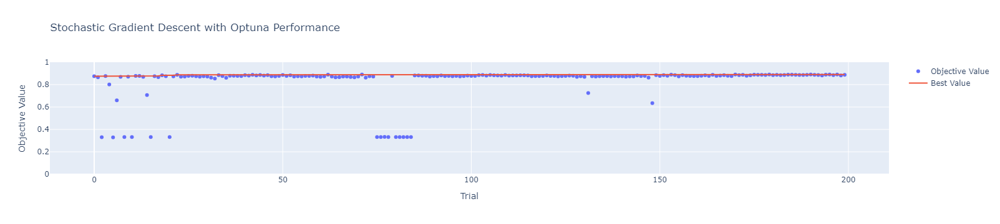

In [35]:
fig = plot_optimization_history(study_sgd)

fig.update_layout(yaxis_range=[0, 1], title="Stochastic Gradient Descent with Optuna Performance")
fig.write_image('Graphs/Modeling/sgd_optuna_performance1.png')
fig.show()

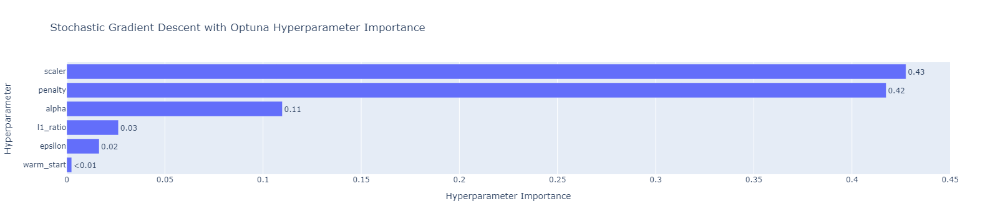

In [36]:
fig = plot_param_importances(study_sgd)

fig.update_layout(title="Stochastic Gradient Descent with Optuna Hyperparameter Importance")

fig.write_image('Graphs/Modeling/sgd_optuna_performance2.png')
fig.show()

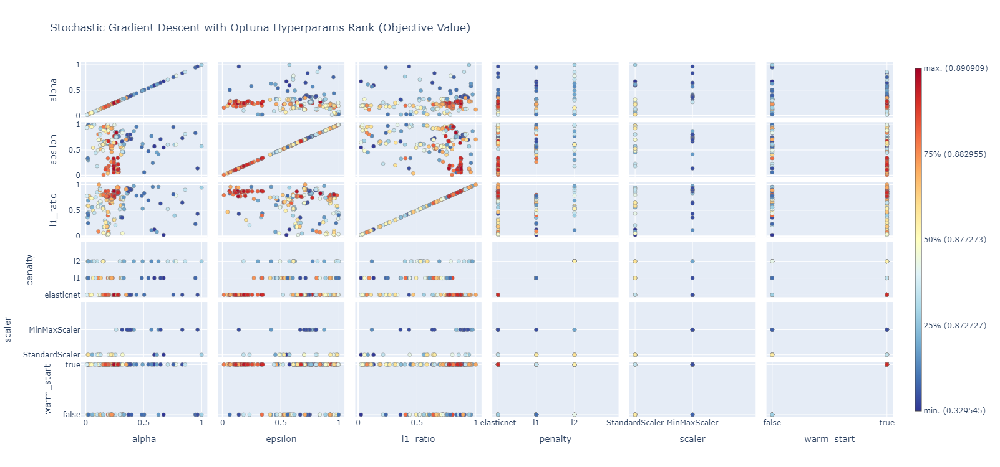

In [37]:
fig = plot_rank(study_sgd)
fig.update_layout(title="Stochastic Gradient Descent with Optuna Hyperparams Rank (Objective Value)", width=1130, height=750)
fig.write_image('Graphs/Modeling/sgd_optuna_performance3.png')
fig.show()

In [38]:
params = study_sgd.best_trial.params
params.pop('scaler')
params

{'alpha': 0.28300297592601464,
 'epsilon': 0.12395185726780861,
 'l1_ratio': 0.8454353766889715,
 'penalty': 'elasticnet',
 'warm_start': True}

In [39]:
sgd_optuna = SGDClassifier(**params, random_state=33).fit(X_train, y_train)
sgd_optuna.score(X_test, y_test)

0.9045454545454545

In [40]:
y_pred = sgd_optuna.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.93      0.87      0.90        82
           1       0.94      0.91      0.93        68
           2       0.85      0.94      0.89        70

    accuracy                           0.90       220
   macro avg       0.91      0.91      0.91       220
weighted avg       0.91      0.90      0.90       220



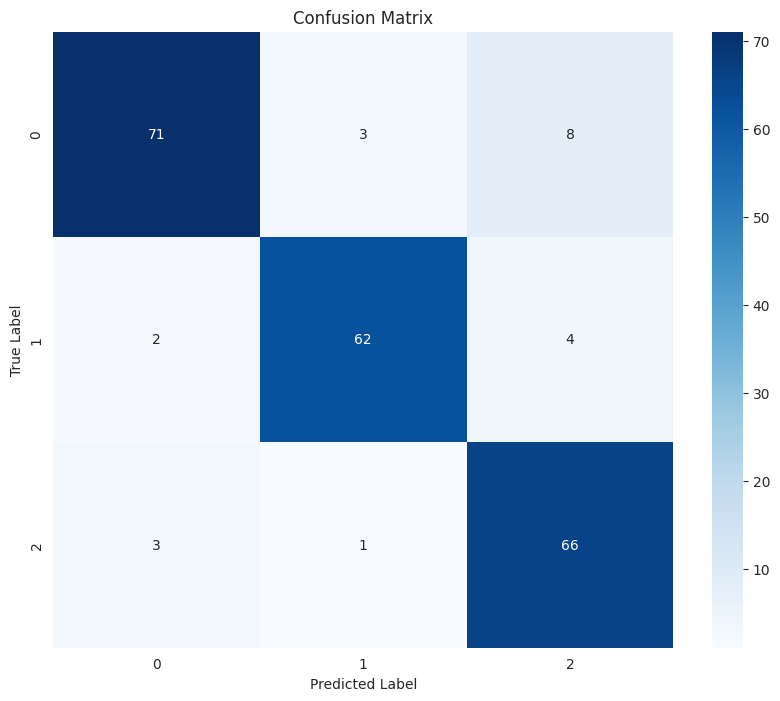

In [41]:
plot_confusion_matrix(y_test, y_pred, 'sgd_optuna_cm')

### Suport Vector Machine

In [42]:
svc = SVC()
svc.fit(X_train, y_train)

SVC()

In [43]:
svc.score(X_test, y_test)

0.9181818181818182

In [44]:
y_pred = svc.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.87      0.92        82
           1       0.90      0.93      0.91        68
           2       0.88      0.97      0.93        70

    accuracy                           0.92       220
   macro avg       0.92      0.92      0.92       220
weighted avg       0.92      0.92      0.92       220



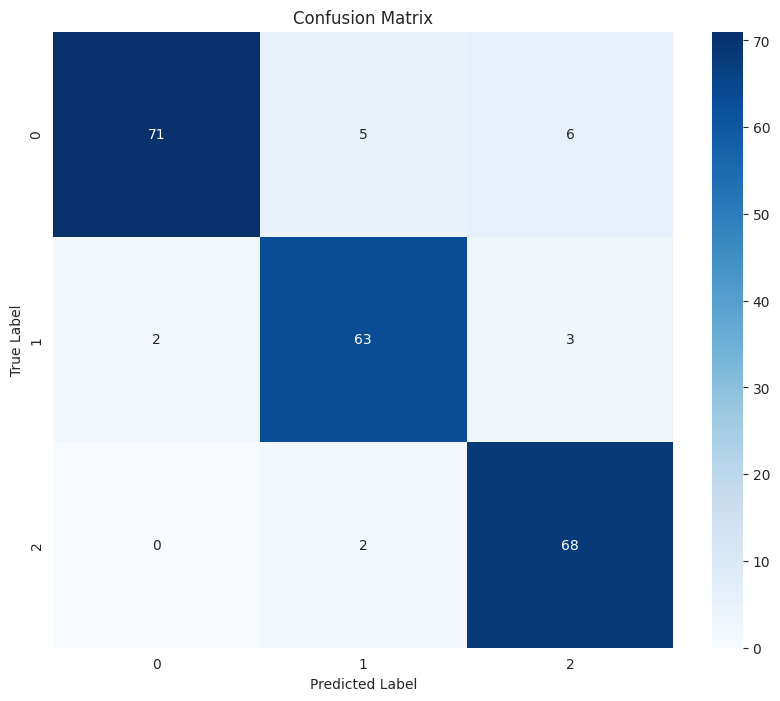

In [45]:
plot_confusion_matrix(y_test, y_pred, 'svc_cm')

In [46]:
params = {
    'C': np.linspace(.001, 10, 20),
    'kernel': ['linear', 'poly', 'rbf'],
    'max_iter': [1000]
}

In [47]:
svc_grid_search = GridSearchCV(SVC(random_state=33), params, cv=5, n_jobs=-1)
svc_grid_search.fit(X_train, y_train)

/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:299: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/

GridSearchCV(cv=5, estimator=SVC(random_state=33), n_jobs=-1,
             param_grid={'C': array([1.00000000e-03, 5.27263158e-01, 1.05352632e+00, 1.57978947e+00,
       2.10605263e+00, 2.63231579e+00, 3.15857895e+00, 3.68484211e+00,
       4.21110526e+00, 4.73736842e+00, 5.26363158e+00, 5.78989474e+00,
       6.31615789e+00, 6.84242105e+00, 7.36868421e+00, 7.89494737e+00,
       8.42121053e+00, 8.94747368e+00, 9.47373684e+00, 1.00000000e+01]),
                         'kernel': ['linear', 'poly', 'rbf'],
                         'max_iter': [1000]})

In [48]:
svc_grid_search.score(X_test, y_test)

0.9

In [49]:
y_pred = svc_grid_search.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.89      0.91        82
           1       0.87      0.90      0.88        68
           2       0.89      0.91      0.90        70

    accuracy                           0.90       220
   macro avg       0.90      0.90      0.90       220
weighted avg       0.90      0.90      0.90       220



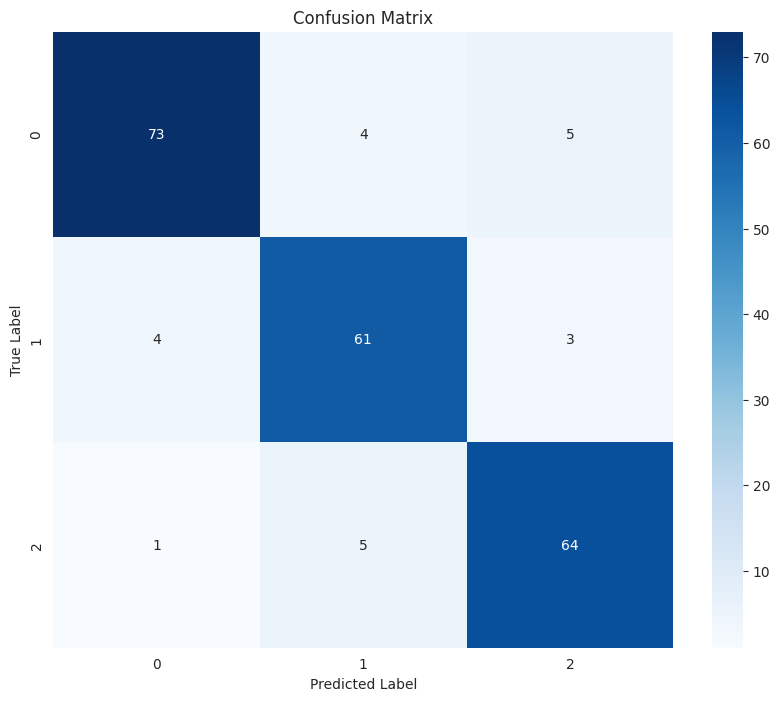

In [50]:
plot_confusion_matrix(y_test, y_pred, 'svc_grid_cm')

In [51]:
def objective_svc(trial):
    # Suggest scaling technique
    scaler = trial.suggest_categorical('scaler', ['StandardScaler', 'MinMaxScaler', None])
    if scaler == 'StandardScaler':
        scaler = StandardScaler()
    elif scaler == 'MinMaxScaler':
        scaler = MinMaxScaler()
    
    # Suggest hyperparameters for SVC
    c_value = trial.suggest_float('C', 0.01, 100.0, log=True)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
    degree = trial.suggest_int('degree', 2, 5) if kernel == 'poly' else 3  # Only relevant for 'poly' kernel
    coef0 = trial.suggest_float('coef0', 0.0, 10.0) if kernel in ['poly', 'sigmoid'] else 0.0
    
    # Define the SVC model with the suggested hyperparameters
    svc = SVC(C=c_value,
              kernel=kernel,
              gamma=gamma,
              degree=degree,
              coef0=coef0,
              random_state=33
             )

    # Create a pipeline with scaler and SVC
    pipeline = make_pipeline(scaler, svc)
    
    # Cross-validation score
    score = cross_val_score(pipeline, X_train, y_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [52]:
study_svc = optuna.create_study(direction="maximize")
study_svc.optimize(objective_svc, n_trials=200, n_jobs=-1)

[I 2024-10-10 18:27:06,121] A new study created in memory with name: no-name-e328eb5a-f844-4b36-bb14-75a3cf99afff
[I 2024-10-10 18:27:07,680] Trial 5 finished with value: 0.8693181818181819 and parameters: {'scaler': None, 'C': 26.83808644893646, 'kernel': 'rbf', 'gamma': 'auto'}. Best is trial 5 with value: 0.8693181818181819.
[I 2024-10-10 18:27:07,686] Trial 2 finished with value: 0.3397727272727272 and parameters: {'scaler': 'StandardScaler', 'C': 41.04551332086738, 'kernel': 'sigmoid', 'gamma': 'scale', 'coef0': 6.849781640387995}. Best is trial 5 with value: 0.8693181818181819.
[I 2024-10-10 18:27:07,702] Trial 12 finished with value: 0.3397727272727272 and parameters: {'scaler': 'MinMaxScaler', 'C': 16.609475037839626, 'kernel': 'sigmoid', 'gamma': 'auto', 'coef0': 6.86442926086364}. Best is trial 5 with value: 0.8693181818181819.
[I 2024-10-10 18:27:07,707] Trial 1 finished with value: 0.8602272727272728 and parameters: {'scaler': None, 'C': 0.17688364286387517, 'kernel': 'poly

In [53]:
print('Number of finished trials: ', len(study_svc.trials))
print('Best trial:')
trial = study_svc.best_trial

print('Value: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'    {key}: {value}')

Number of finished trials:  200
Best trial:
Value:  0.8818181818181818
Params: 
    scaler: StandardScaler
    C: 3.979381399129506
    kernel: linear
    gamma: scale


In [54]:
trials_df = study_svc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_C,params_coef0,params_degree,params_gamma,params_kernel,params_scaler,state
172,172,0.881818,2024-10-10 18:27:21.699956,2024-10-10 18:27:22.714551,0 days 00:00:01.014595,4.066352,NaN,NaN,scale,linear,StandardScaler,COMPLETE
170,170,0.881818,2024-10-10 18:27:21.527472,2024-10-10 18:27:22.663475,0 days 00:00:01.136003,3.979381,NaN,NaN,scale,linear,StandardScaler,COMPLETE
118,118,0.880682,2024-10-10 18:27:13.693483,2024-10-10 18:27:16.396893,0 days 00:00:02.703410,99.682505,NaN,NaN,scale,linear,StandardScaler,COMPLETE
117,117,0.880682,2024-10-10 18:27:13.504031,2024-10-10 18:27:16.087985,0 days 00:00:02.583954,90.017773,NaN,NaN,scale,linear,StandardScaler,COMPLETE
116,116,0.880682,2024-10-10 18:27:13.452142,2024-10-10 18:27:16.077926,0 days 00:00:02.625784,97.552351,NaN,NaN,scale,linear,StandardScaler,COMPLETE


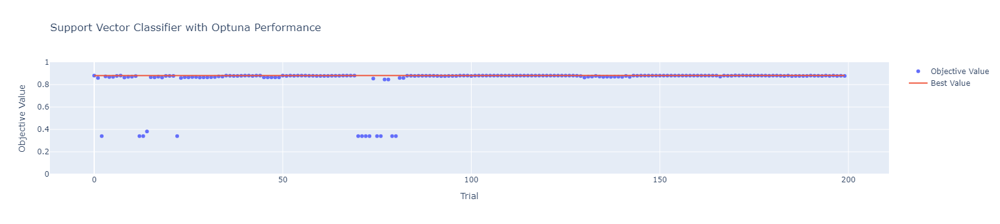

In [55]:
fig = plot_optimization_history(study_svc)

fig.update_layout(yaxis_range=[0, 1], title="Support Vector Classifier with Optuna Performance")
fig.write_image('Graphs/Modeling/svc_optuna_performance1.png')
fig.show()

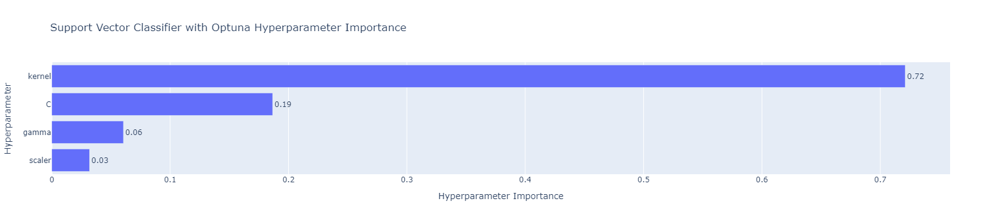

In [56]:
fig = plot_param_importances(study_svc)

fig.update_layout(title="Support Vector Classifier with Optuna Hyperparameter Importance")

fig.write_image('Graphs/Modeling/svc_optuna_performance2.png')
fig.show()

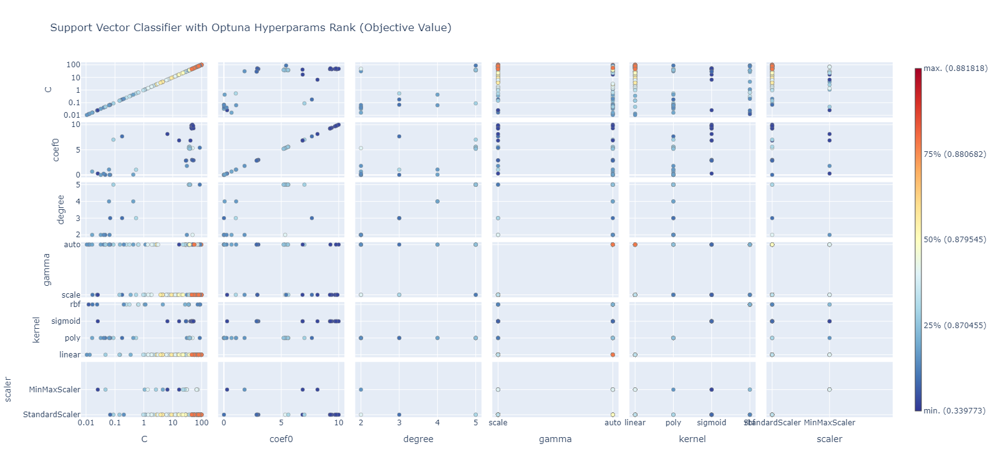

In [57]:
fig = plot_rank(study_svc)
fig.update_layout(title="Support Vector Classifier with Optuna Hyperparams Rank (Objective Value)", width=1130, height=750)
fig.write_image('Graphs/Modeling/svc_optuna_performance3.png')
fig.show()

In [58]:
params = study_svc.best_trial.params
params.pop('scaler')
params

{'C': 3.979381399129506, 'kernel': 'linear', 'gamma': 'scale'}

In [59]:
svc_optuna = SVC(**params, random_state=33).fit(X_train, y_train)
svc_optuna.score(X_test, y_test)

0.9

In [60]:
y_pred = svc_optuna.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.89      0.91        82
           1       0.90      0.88      0.89        68
           2       0.87      0.93      0.90        70

    accuracy                           0.90       220
   macro avg       0.90      0.90      0.90       220
weighted avg       0.90      0.90      0.90       220



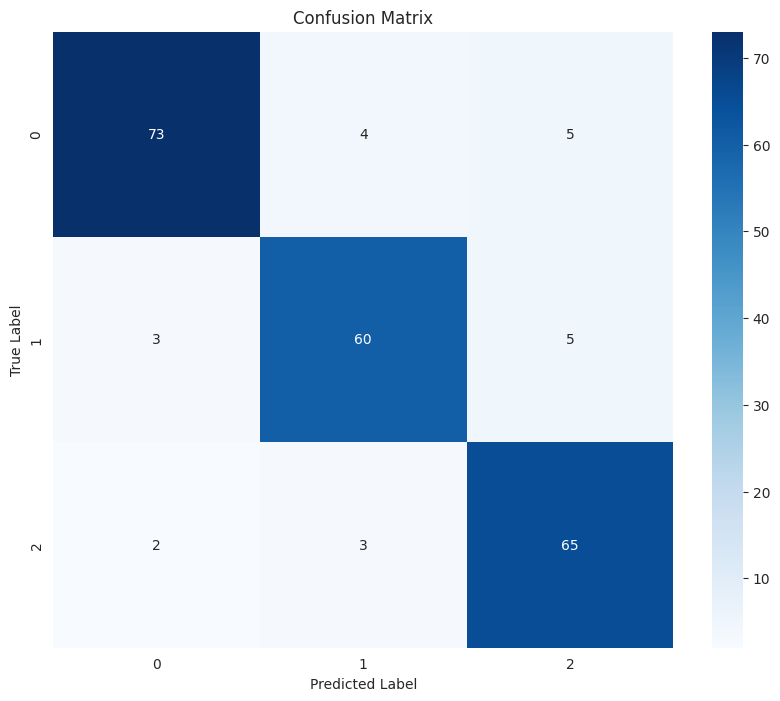

In [61]:
plot_confusion_matrix(y_test, y_pred, 'svc_optuna_cm')

### Decision Tree

In [22]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [23]:
dt.score(X_test, y_test)

0.9318181818181818

### AdaBoost

In [24]:
adab = AdaBoostClassifier()
adab.fit(X_train, y_train)

AdaBoostClassifier()

In [25]:
adab.score(X_test, y_test)

0.7727272727272727

### Extra Trees

In [26]:
etr = ExtraTreesClassifier()
etr.fit(X_train, y_train)

ExtraTreesClassifier()

In [27]:
etr.score(X_test, y_test)

0.9090909090909091

### Random Forest

In [28]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [29]:
rf.score(X_test, y_test)

0.8863636363636364

### Gradient Boosting

In [30]:
gb = GradientBoostingClassifier()
gb.fit(X_train, y_train)

GradientBoostingClassifier()

In [31]:
gb.score(X_test, y_test)

0.9090909090909091

### XGBoost

In [32]:
xgb = XGBClassifier()
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [33]:
xgb.score(X_test, y_test)

0.9227272727272727

### LightGBM

In [34]:
lgb = LGBMClassifier()
lgb.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 171
[LightGBM] [Info] Number of data points in the train set: 880, number of used features: 19
[LightGBM] [Info] Start training from score -1.106599
[LightGBM] [Info] Start training from score -1.110041
[LightGBM] [Info] Start training from score -1.079478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

LGBMClassifier()

In [35]:
lgb.score(X_test, y_test)

0.9090909090909091

## 6. Nerual Network
---

In [89]:
def nn_predictions(model, X, y, string):
    predictions = np.argmax(model.predict(X), axis=1)
    
    plt.figure(figsize=(10, 8))

    cm = np.round(confusion_matrix(y, predictions), 0)
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
    
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')

    plt.savefig('Graphs/' + string + '.png')    
    plt.show()

def nn_accuracy(model, X, y):
    predictions = np.argmax(model.predict(X), axis=1)
    print('Total accuracy score: ' + str(round(accuracy_score(y, predictions), 5) * 100) + '%')

def nn_evaluate(model, X, y):
    model.evaluate(X, tf.one_hot(y, depth=3))

def classification_reporting(X, y):
    print(classification_report(y, np.argmax(model.predict(X), axis=1)))

def nn_training_performance(history):
    plt.figure(figsize=(16, 10))

    for metric in history.history.keys():
        sns.lineplot(history.history[metric], label=metric)
    
    legend = plt.legend(title='Metrics', loc='center right', prop={'size': 17})
    legend.get_title().set_fontsize('17')
    plt.title('Training Performance', fontsize=20)
    plt.tick_params(axis='both', which='major', labelsize=12)

    plt.savefig('Graphs/nn_performance.png')
    plt.show()

In [37]:
X = student_stress.iloc[:, :-1].drop('blood_pressure', axis=1)
y = student_stress['stress_level']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=33, shuffle=True)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state=33, shuffle=True)

In [38]:
tf.random.set_seed(33)
normalizer = tf.keras.layers.Normalization(axis=-1)  # axis=-1 normalizes features (last axis)
normalizer.adapt(np.array(X_train))

model = tf.keras.Sequential([
    normalizer,
    tf.keras.layers.Dense(3, activation='tanh'),
    tf.keras.layers.Dense(5, activation='tanh'), 
    # tf.keras.layers.Dense(5, activation='tanh'),
    tf.keras.layers.Dense(3, activation='softmax'),
])

model.compile(optimizer=tf.keras.optimizers.Adamax(),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

history = model.fit(X_train,
                    tf.one_hot(y_train, depth=y_train.nunique()),
                    epochs=150,
                    batch_size=33,
                    validation_data=(X_val, tf.one_hot(y_val, depth=3))
                   )


Epoch 1/150


24/24 [==============================] - 1s 6ms/step - loss: 1.3832 - accuracy: 0.1883 - val_loss: 1.2443 - val_accuracy: 0.2364
Epoch 2/150
24/24 [==============================] - 0s 2ms/step - loss: 1.2122 - accuracy: 0.2532 - val_loss: 1.0986 - val_accuracy: 0.3939
Epoch 3/150
24/24 [==============================] - 0s 1ms/step - loss: 1.0917 - accuracy: 0.4078 - val_loss: 1.0013 - val_accuracy: 0.5152
Epoch 4/150
24/24 [==============================] - 0s 1ms/step - loss: 1.0090 - accuracy: 0.5065 - val_loss: 0.9344 - val_accuracy: 0.5758
Epoch 5/150
24/24 [==============================] - 0s 2ms/step - loss: 0.9504 - accuracy: 0.6182 - val_loss: 0.8837 - val_accuracy: 0.7030
Epoch 6/150
24/24 [==============================] - 0s 2ms/step - loss: 0.9054 - accuracy: 0.7065 - val_loss: 0.8451 - val_accuracy: 0.7576
Epoch 7/150
24/24 [==============================] - 0s 1ms/step - loss: 0.8709 - accuracy: 0.7338 - val_loss: 0.8146 - val_accuracy: 0.7758
Epoch 8/15

In [39]:
nn_evaluate(model, X_test, y_test)

6/6 [==============================] - 0s 1000us/step - loss: 0.2372 - accuracy: 0.9273


In [40]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizati  (None, 19)                39        
 on)                                                             
                                                                 
 dense (Dense)               (None, 3)                 60        
                                                                 
 dense_1 (Dense)             (None, 5)                 20        
                                                                 
 dense_2 (Dense)             (None, 3)                 18        
                                                                 
Total params: 137 (552.00 Byte)
Trainable params: 98 (392.00 Byte)
Non-trainable params: 39 (160.00 Byte)
_________________________________________________________________


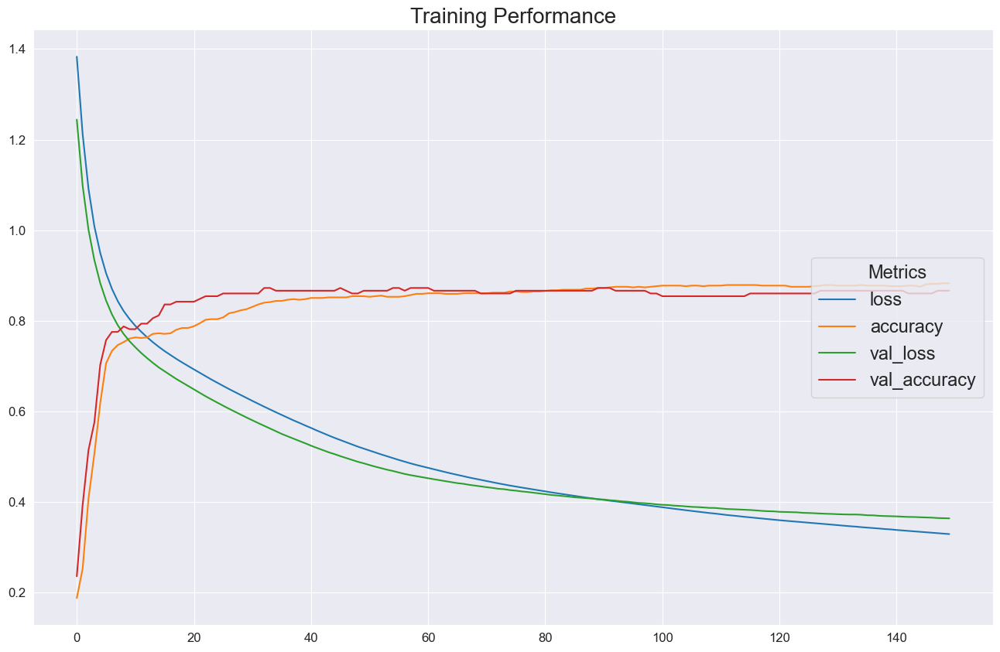

In [41]:
nn_training_performance(history)

In [42]:
classification_reporting(X_test, y_test)

6/6 [==============================] - 0s 903us/step
              precision    recall  f1-score   support

           0       0.93      0.92      0.92        72
           1       0.93      0.91      0.92        44
           2       0.92      0.96      0.94        49

    accuracy                           0.93       165
   macro avg       0.93      0.93      0.93       165
weighted avg       0.93      0.93      0.93       165



6/6 [==============================] - 0s 800us/step


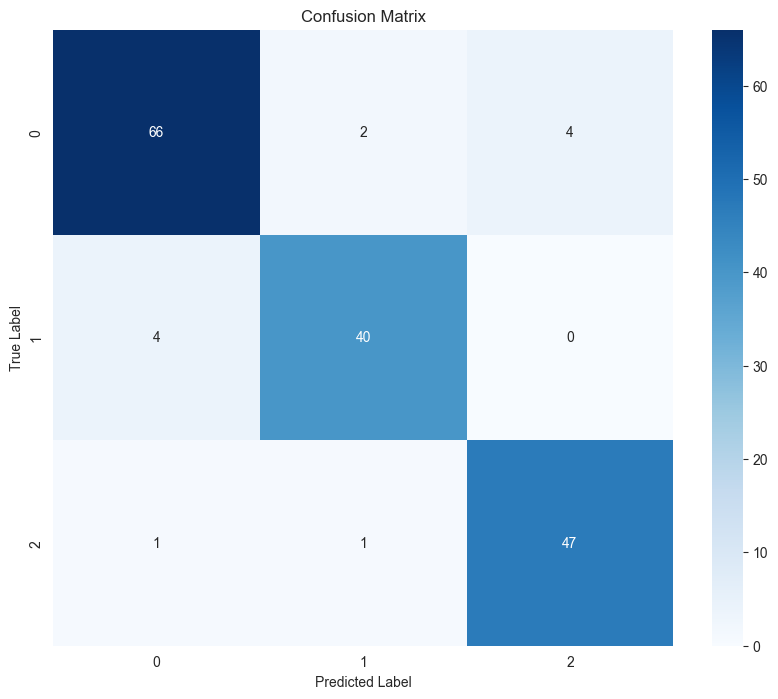

In [43]:
nn_predictions(model, X_test, y_test, 'nn_predictions')